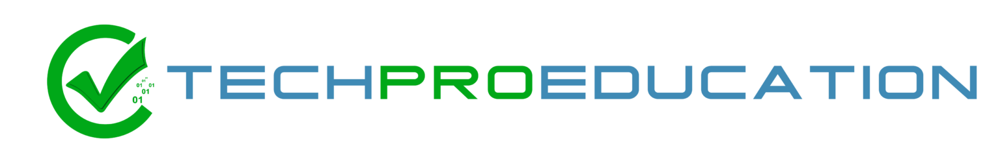

# EFFECTIVE DATA VISUALIZATION IN DATA SCIENCE WITH MATPLOTLIB AND SEABORN

## CODING TASK #1. PLOT PIE CHART USING MATPLOTLIB

- **The plot method on Pandas Series and DataFrames is just a simple wrapper around plt.plot():**
- **Define a Pandas Dataframe with all crypto allocation in a given portfolio**
- **Note that total sum = 100%** 
- **Use matplotlib to plot a pie chart** 

In [85]:
# The plot method on Pandas Series and DataFrames is just a simple wrapper around plt.plot():
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [86]:
# Define a Pandas Dataframe with all crypto allocation in a given portfolio
# Note that total sum = 100% 
crypto_df = pd.DataFrame(data = {'allocation %':[20, 55, 5, 17, 3]}, index = ['BTC', 'ETH', 'LTC', 'XRP', 'ADA'])
crypto_df

,allocation %
BTC,20
ETH,55
LTC,5
XRP,17
ADA,3


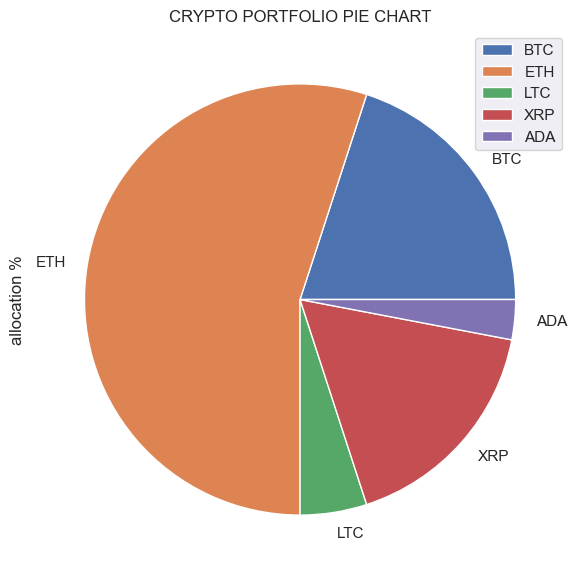

In [83]:
# Use matplotlib to plot a pie chart 
crypto_df.plot.pie(y = 'allocation %', figsize = (7, 7))
plt.title('CRYPTO PORTFOLIO PIE CHART');

**PRACTICE OPPORTUNITY #1:**
- **Assume that you became bullish on XRP and decided to allocate 60% of your assets in it. You also decided to equally divide the rest of your assets in other coins (BTC, LTC, ADA, and ETH). Change the allocations and plot the pie chart.**
- **Use 'explode' to increase the separation between XRP and the rest of the portfolio (External Research is Required)**

In [87]:
# Update the allocations
crypto_df.loc['XRP', 'allocation %'] = 60
equal_allocation = (100 - 60) / 4
crypto_df.loc[['BTC', 'ETH', 'LTC', 'ADA'], 'allocation %'] = equal_allocation

In [13]:
crypto_df

,allocation %
BTC,10
ETH,10
LTC,10
XRP,60
ADA,10


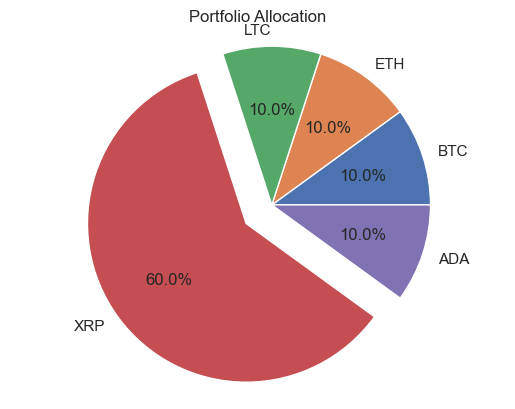

In [88]:
# Plot the pie chart
explode = [0, 0, 0, 0.2, 0]  # Increase separation for XRP
plt.pie(crypto_df['allocation %'], labels=crypto_df.index, explode=explode, autopct='%1.1f%%')

plt.title('Portfolio Allocation')
plt.axis('equal')  # Ensure pie is drawn as a circle
plt.show()

## CODING TASK #2. PLOT SINGLE & MULTIPLE LINE PLOTS USING MATPLOTLIB
- **Use Pandas read_csv to read crypto_daily_prices (BTC, ETH, and LTC)**
- **Use matplotlib on the Pandas DataFrame to plot the data**

In [89]:
investments_df = pd.read_csv('crypto_daily_prices.csv')
investments_df

,Date,BTC,ETH,ADA
0,9/17/2014,457.334015,NaN,NaN
1,9/18/2014,424.440002,NaN,NaN
2,9/19/2014,394.795990,NaN,NaN
3,9/20/2014,408.903992,NaN,NaN
4,9/21/2014,398.821014,NaN,NaN
...,...,...,...,...
2828,6/15/2022,22572.839840,1233.206421,0.533296
2829,6/16/2022,20381.650390,1067.730713,0.475022
2830,6/17/2022,20471.482420,1086.519287,0.487392
2831,6/18/2022,19017.642580,993.636780,0.456182


In [91]:
# Set the date as index and create another column as "year"
investments_df = investments_df.set_index('Date')

KeyError: "None of ['Date'] are in the columns"

In [98]:
investments_df.index = pd.to_datetime(investments_df.index)
investments_df['Date'] = pd.to_datetime(investments_df.index).strftime('%Y-%m-%d')
investments_df['day_of_week'] = investments_df.index.day_name()
investments_df['day_of_month'] = investments_df.index.day
investments_df['month'] = investments_df.index.month
investments_df['year'] = investments_df.index.year

In [99]:
investments_df

,BTC,ETH,ADA,day_of_week,day_of_month,month,year,Date
Date,,,,,,,,
2014-09-17,457.334015,NaN,NaN,Wednesday,17,9,2014,2014-09-17
2014-09-18,424.440002,NaN,NaN,Thursday,18,9,2014,2014-09-18
2014-09-19,394.795990,NaN,NaN,Friday,19,9,2014,2014-09-19
2014-09-20,408.903992,NaN,NaN,Saturday,20,9,2014,2014-09-20
2014-09-21,398.821014,NaN,NaN,Sunday,21,9,2014,2014-09-21
...,...,...,...,...,...,...,...,...
2022-06-15,22572.839840,1233.206421,0.533296,Wednesday,15,6,2022,2022-06-15
2022-06-16,20381.650390,1067.730713,0.475022,Thursday,16,6,2022,2022-06-16
2022-06-17,20471.482420,1086.519287,0.487392,Friday,17,6,2022,2022-06-17


In [135]:
new_df = pd.read_csv('crypto_daily_prices.csv')
new_df

,Date,BTC,ETH,ADA
0,9/17/2014,457.334015,NaN,NaN
1,9/18/2014,424.440002,NaN,NaN
2,9/19/2014,394.795990,NaN,NaN
3,9/20/2014,408.903992,NaN,NaN
4,9/21/2014,398.821014,NaN,NaN
...,...,...,...,...
2828,6/15/2022,22572.839840,1233.206421,0.533296
2829,6/16/2022,20381.650390,1067.730713,0.475022
2830,6/17/2022,20471.482420,1086.519287,0.487392
2831,6/18/2022,19017.642580,993.636780,0.456182


<AxesSubplot:xlabel='Date'>

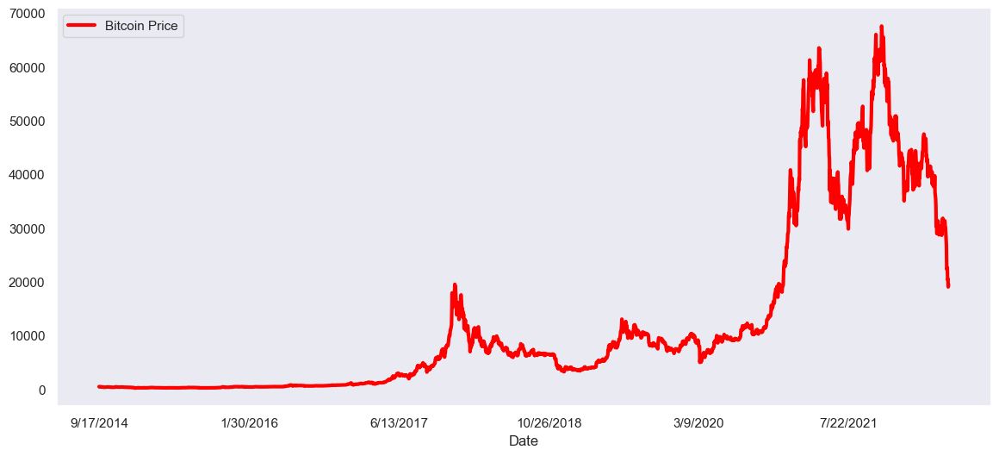

In [137]:
new_df.plot(x="Date", y="BTC", label="Bitcoin Price", color="red", lw=3, figsize=(14,6))

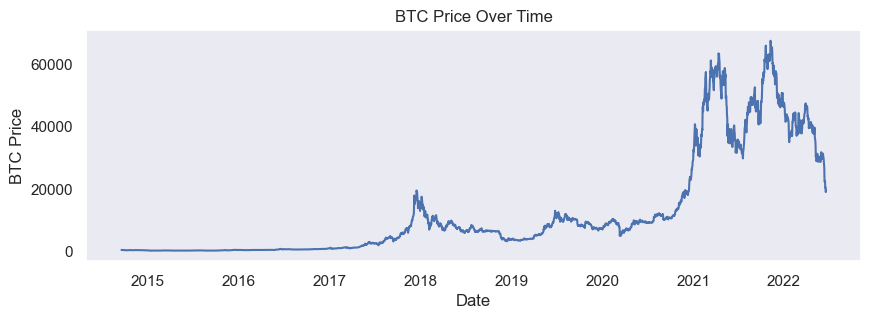

In [94]:
plt.figure(figsize=(10, 3))

plt.plot(investments_df.index, investments_df['BTC'])

plt.xlabel('Date')
plt.ylabel('BTC Price')
plt.title('BTC Price Over Time')

plt.show()

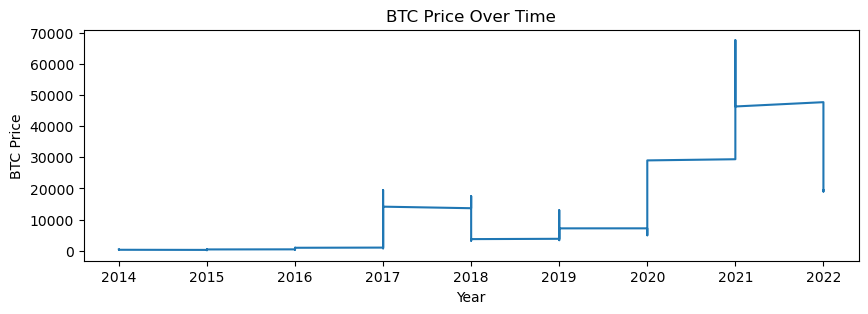

In [35]:
plt.figure(figsize=(10, 3))

plt.plot(investments_df['year'], investments_df['BTC'])

plt.xlabel('Year')
plt.ylabel('BTC Price')
plt.title('BTC Price Over Time')

plt.show()

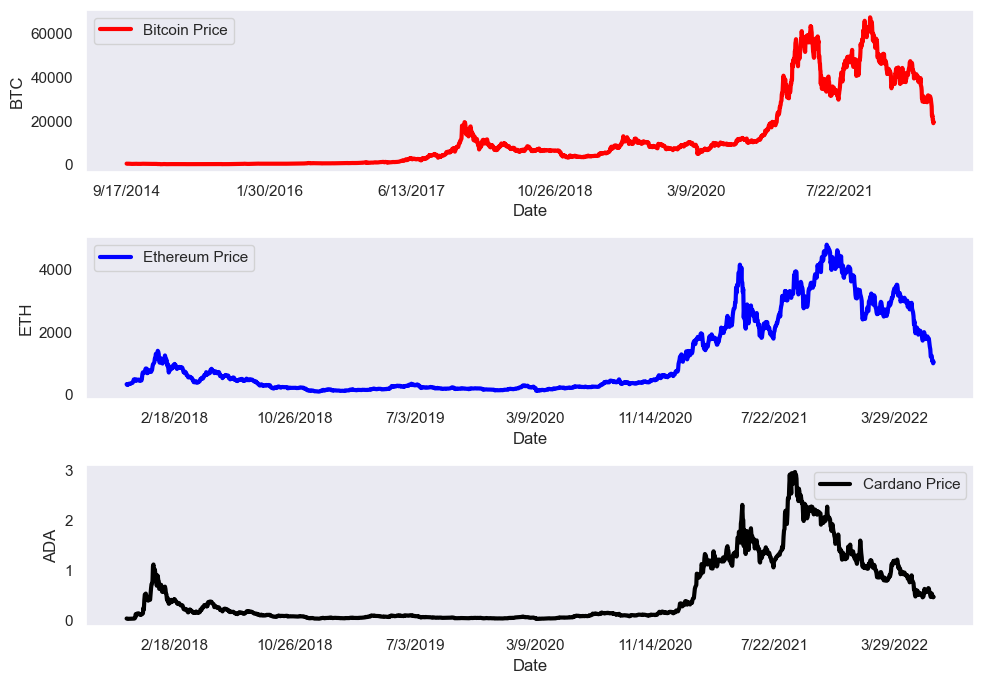

In [143]:
fig, ax = plt.subplots(3, 1, figsize=(10, 7))

new_df.plot(x="Date", y="BTC", label="Bitcoin Price", color="red", lw=3, ax=ax[0])
new_df.plot(x="Date", y="ETH", label="Ethereum Price", color="blue", lw=3, ax=ax[1])
new_df.plot(x="Date", y="ADA", label="Cardano Price", color="black", lw=3, ax=ax[2])

ax[0].set_ylabel('BTC')
ax[1].set_ylabel('ETH')
ax[2].set_ylabel('ADA')

plt.xlabel('Date')
plt.tight_layout()

plt.show()

<Figure size 1000x300 with 0 Axes>

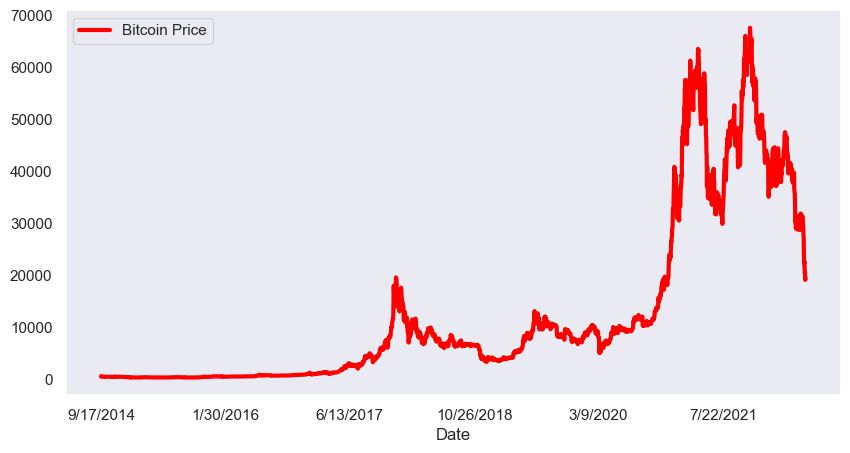

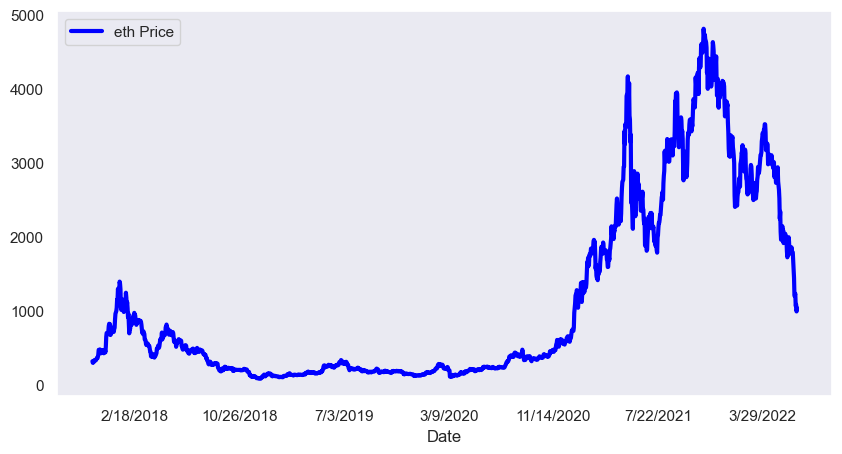

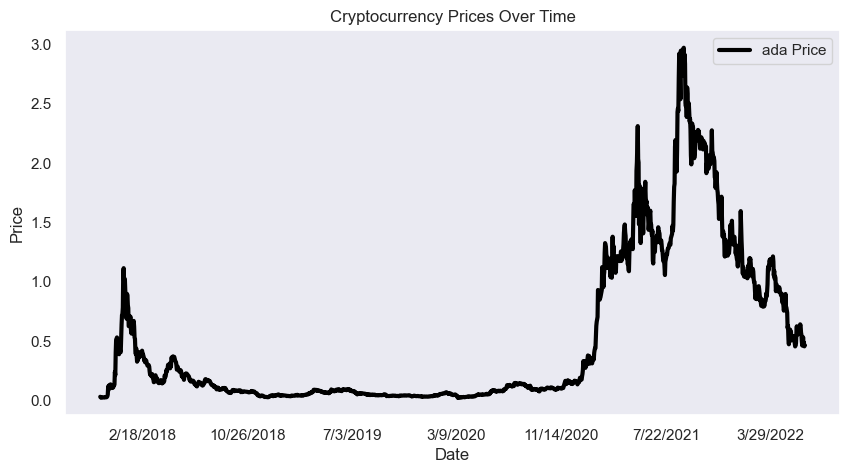

In [140]:
plt.figure(figsize=(10, 3))

new_df.plot(x="Date", y="BTC", label="Bitcoin Price", color="red", lw=3, figsize=(10,5))
new_df.plot(x="Date", y="ETH", label="eth Price", color="blue", lw=3, figsize=(10,5))
new_df.plot(x="Date", y="ADA", label="ada Price", color="black", lw=3, figsize=(10,5))

plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Cryptocurrency Prices Over Time')
plt.legend()

plt.show()

**PRACTICE OPPORTUNITY #2:**
- **Use subplots attribute to plot separate figures for BTC, ETH, and ADA**

<Figure size 1000x300 with 0 Axes>

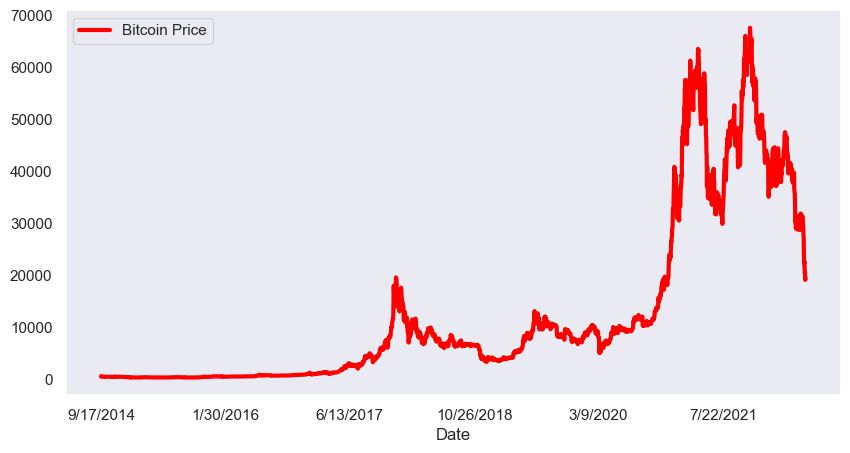

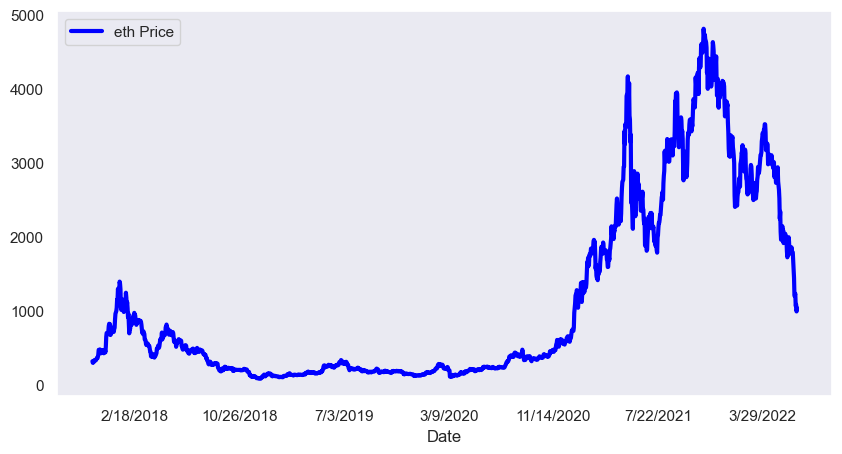

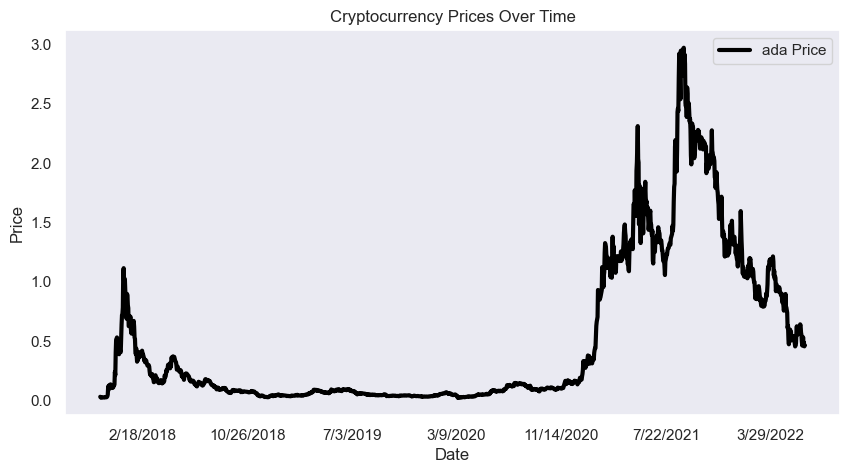

In [139]:
plt.figure(figsize=(10, 3))

new_df.plot(x="Date", y="BTC", label="Bitcoin Price", color="red", lw=3, figsize=(10,5))
new_df.plot(x="Date", y="ETH", label="eth Price", color="blue", lw=3, figsize=(10,5))
new_df.plot(x="Date", y="ADA", label="ada Price", color="black", lw=3, figsize=(10,5))

plt.xlabel('Date')
plt.ylabel('Price')
plt.title('Cryptocurrency Prices Over Time')
plt.legend()

plt.show()

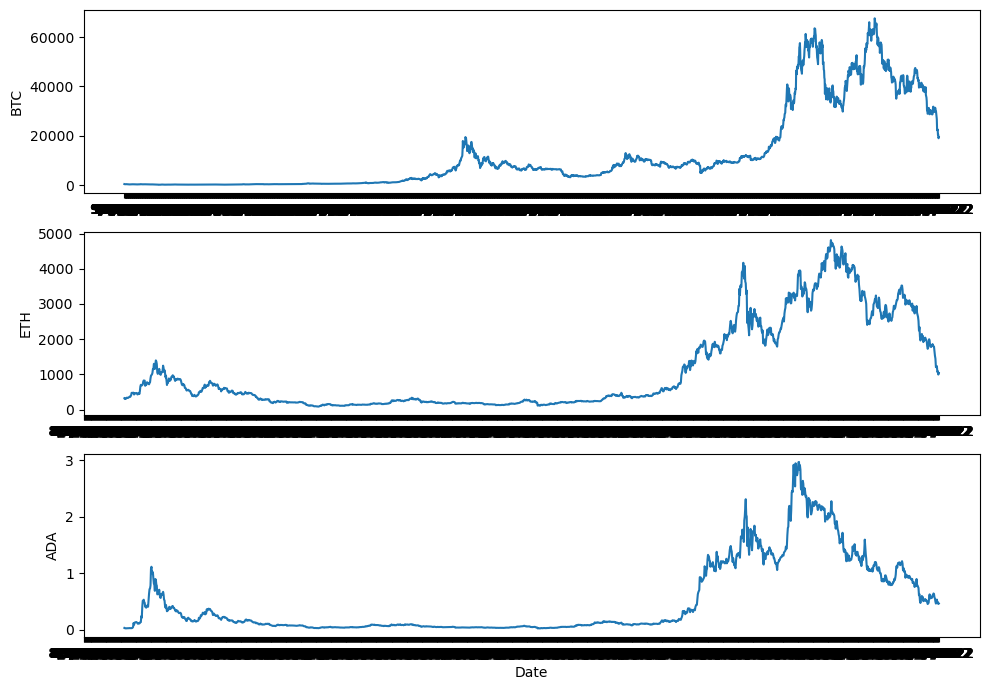

In [30]:
fig, ax = plt.subplots(3, 1, figsize=(10, 7))

ax[0].plot(investments_df['Date'], investments_df['BTC'], label='BTC')
ax[1].plot(investments_df['Date'], investments_df['ETH'], label='ETH')
ax[2].plot(investments_df['Date'], investments_df['ADA'], label='ADA')

ax[0].set_ylabel('BTC')
ax[1].set_ylabel('ETH')
ax[2].set_ylabel('ADA')

plt.xlabel('Date')
plt.tight_layout()

plt.show()

## CODING TASK #3. PLOT SCATTERPLOTS USING MATPLOTLIB
- **Read daily return data using pandas**
- **Plot Daily returns of BTC vs. ETH**

In [39]:
daily_return_df = pd.read_csv('crypto_daily_returns.csv')
daily_return_df

,Date,BTC,ETH,ADA
0,9/17/2014,0.000000,0.000000,0.000000
1,9/18/2014,-7.192558,NaN,NaN
2,9/19/2014,-6.984264,NaN,NaN
3,9/20/2014,3.573492,NaN,NaN
4,9/21/2014,-2.465854,NaN,NaN
...,...,...,...,...
2828,6/15/2022,1.648355,1.778018,10.097317
2829,6/16/2022,-9.707194,-13.418330,-10.927140
2830,6/17/2022,0.440750,1.759673,2.604094
2831,6/18/2022,-7.101781,-8.548629,-6.403471


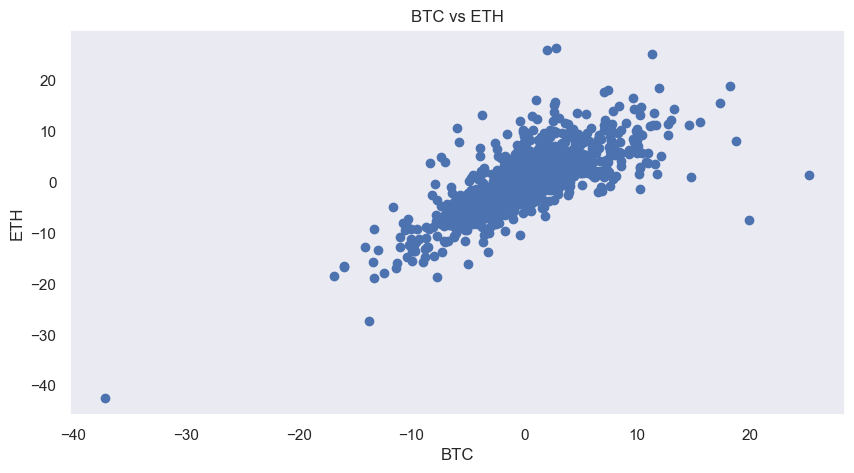

In [146]:
# BTC vs ETH Matplotlib
plt.figure(figsize = (10, 5))
plt.scatter(daily_return_df.BTC, daily_return_df.ETH)
plt.xlabel("BTC")
plt.ylabel("ETH")
plt.title("BTC vs ETH")
plt.show()

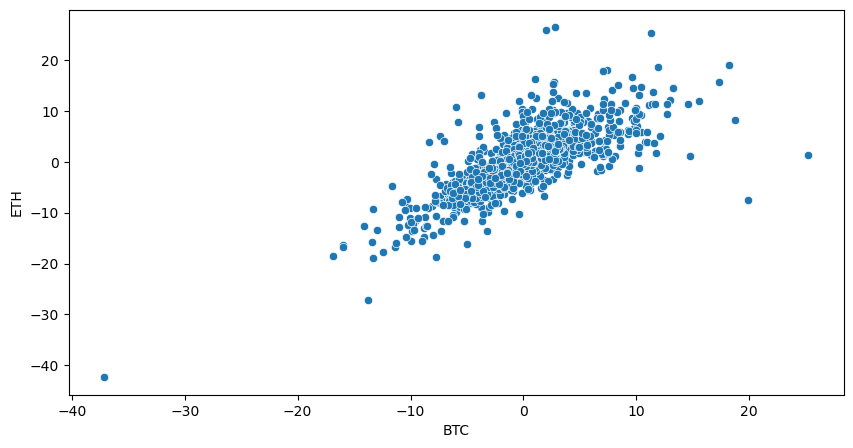

In [44]:
plt.figure(figsize=(10,5))

sns.scatterplot(x = "BTC", y = "ETH", data = daily_return_df)

plt.show();

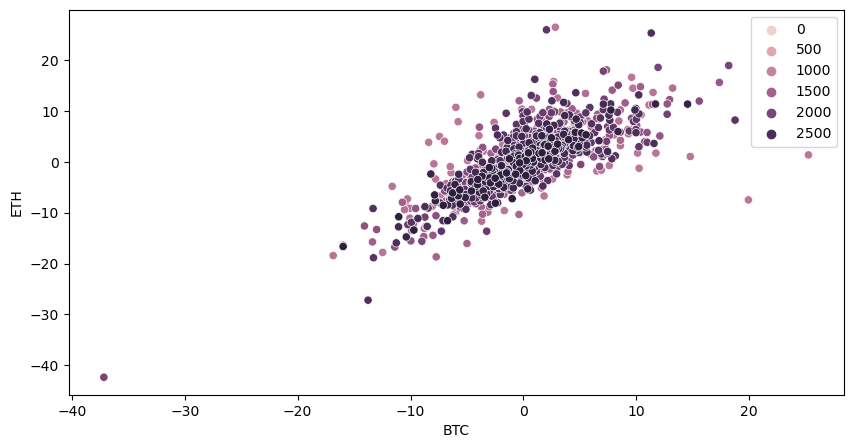

In [45]:
plt.figure(figsize=(10, 5))

sns.scatterplot(x="BTC", y="ETH", data=daily_return_df, hue=daily_return_df.index)

plt.show()

**PRACTICE OPPORTUNITY #3:**
- **Plot the daily returns of BTC vs. ADA, choose your favourite color!**

<AxesSubplot:>

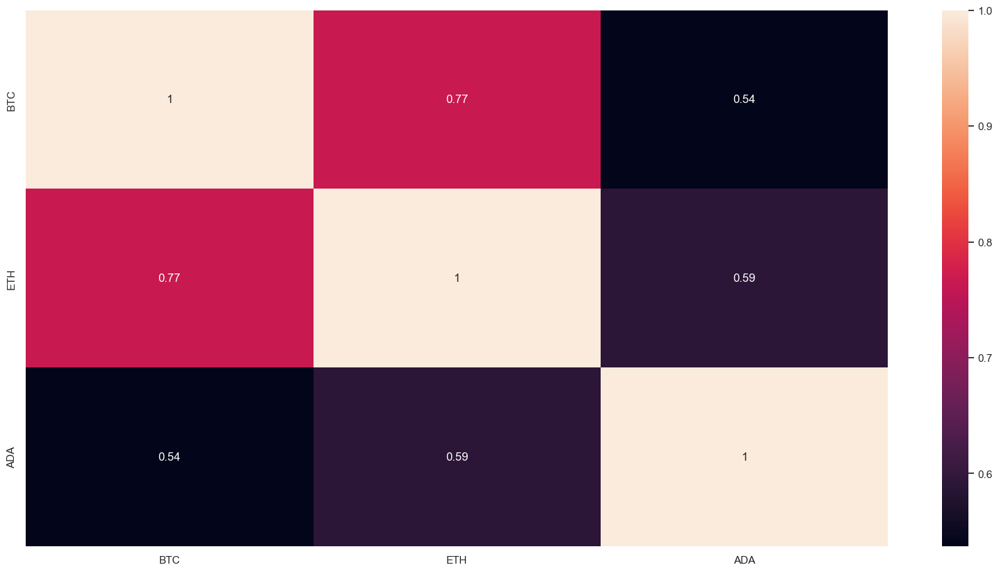

In [128]:
plt.figure(figsize = (20, 10)) 
sns.heatmap(daily_return_df.corr(), annot = True)

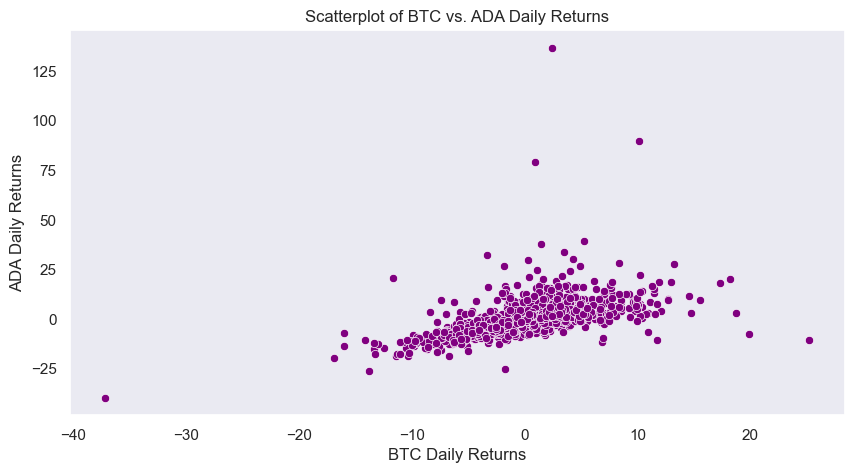

In [147]:
plt.figure(figsize=(10, 5))

sns.scatterplot(x="BTC", y="ADA", data=daily_return_df, color='purple')

plt.xlabel("BTC Daily Returns")
plt.ylabel("ADA Daily Returns")
plt.title("Scatterplot of BTC vs. ADA Daily Returns")

plt.show()

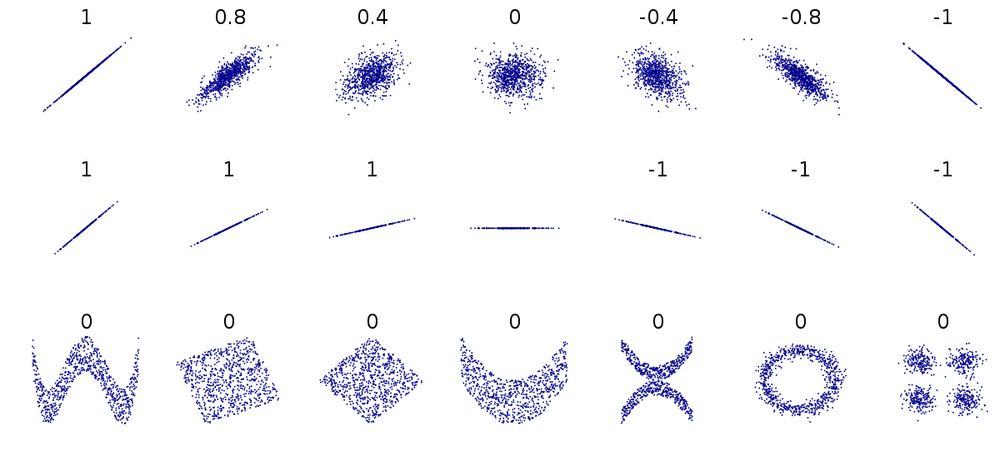

## CODING TASK #4. PLOT HISTOGRAMS USING MATPLOTLIB
- **A histogram represents data using bars with various heights**
- **Each bar groups numbers into specific ranges**
- **Taller bars show that more data falls within that specific range**
- **Plot the histogram of the returns**

In [119]:
daily_return_df = pd.read_csv('crypto_daily_returns.csv')
daily_return_df

,Date,BTC,ETH,ADA
0,9/17/2014,0.000000,0.000000,0.000000
1,9/18/2014,-7.192558,NaN,NaN
2,9/19/2014,-6.984264,NaN,NaN
3,9/20/2014,3.573492,NaN,NaN
4,9/21/2014,-2.465854,NaN,NaN
...,...,...,...,...
2828,6/15/2022,1.648355,1.778018,10.097317
2829,6/16/2022,-9.707194,-13.418330,-10.927140
2830,6/17/2022,0.440750,1.759673,2.604094
2831,6/18/2022,-7.101781,-8.548629,-6.403471


In [101]:
daily_return_df = daily_return_df.set_index("Date")

In [102]:
daily_return_df.index = pd.to_datetime(daily_return_df.index)
daily_return_df['day_of_week'] = daily_return_df.index.day_name()
daily_return_df['day_of_month'] = daily_return_df.index.day
daily_return_df['month'] = daily_return_df.index.month
daily_return_df['year'] = daily_return_df.index.year

In [103]:
daily_return_df

,BTC,ETH,ADA,day_of_week,day_of_month,month,year
Date,,,,,,,
2014-09-17,0.000000,0.000000,0.000000,Wednesday,17,9,2014
2014-09-18,-7.192558,NaN,NaN,Thursday,18,9,2014
2014-09-19,-6.984264,NaN,NaN,Friday,19,9,2014
2014-09-20,3.573492,NaN,NaN,Saturday,20,9,2014
2014-09-21,-2.465854,NaN,NaN,Sunday,21,9,2014
...,...,...,...,...,...,...,...
2022-06-15,1.648355,1.778018,10.097317,Wednesday,15,6,2022
2022-06-16,-9.707194,-13.418330,-10.927140,Thursday,16,6,2022
2022-06-17,0.440750,1.759673,2.604094,Friday,17,6,2022


In [104]:
mu = round(daily_return_df['BTC'].mean(), 2) # mean of distribution
sigma = round(daily_return_df['BTC'].std(), 2) # standard deviation of distribution
 
num_bins = 40

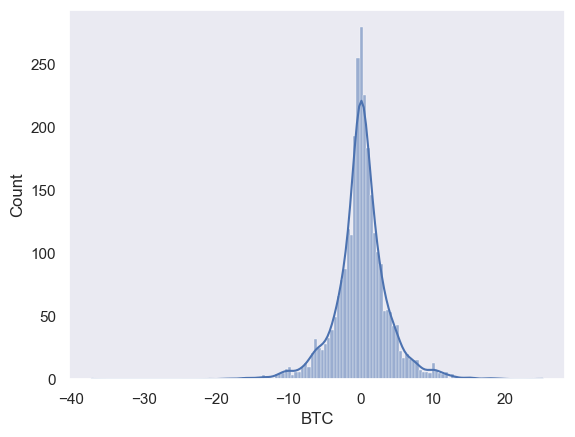

In [105]:
sns.set(style="dark")

sns.histplot(data=daily_return_df, x = "BTC", kde=True)

plt.show();

**PRACTICE OPPORTUNITY #4:**
- **Plot the histogram for BTC and ETH returns using 60 bins. Display all histograms on the same figure**


In [109]:
daily_return_df

,BTC,ETH,ADA,day_of_week,day_of_month,month,year
Date,,,,,,,
2014-09-17,0.000000,0.000000,0.000000,Wednesday,17,9,2014
2014-09-18,-7.192558,NaN,NaN,Thursday,18,9,2014
2014-09-19,-6.984264,NaN,NaN,Friday,19,9,2014
2014-09-20,3.573492,NaN,NaN,Saturday,20,9,2014
2014-09-21,-2.465854,NaN,NaN,Sunday,21,9,2014
...,...,...,...,...,...,...,...
2022-06-15,1.648355,1.778018,10.097317,Wednesday,15,6,2022
2022-06-16,-9.707194,-13.418330,-10.927140,Thursday,16,6,2022
2022-06-17,0.440750,1.759673,2.604094,Friday,17,6,2022


In [125]:
mean = round(daily_return_df["BTC"].mean(),2)
std_sap = round(daily_return_df["BTC"].std(),2)

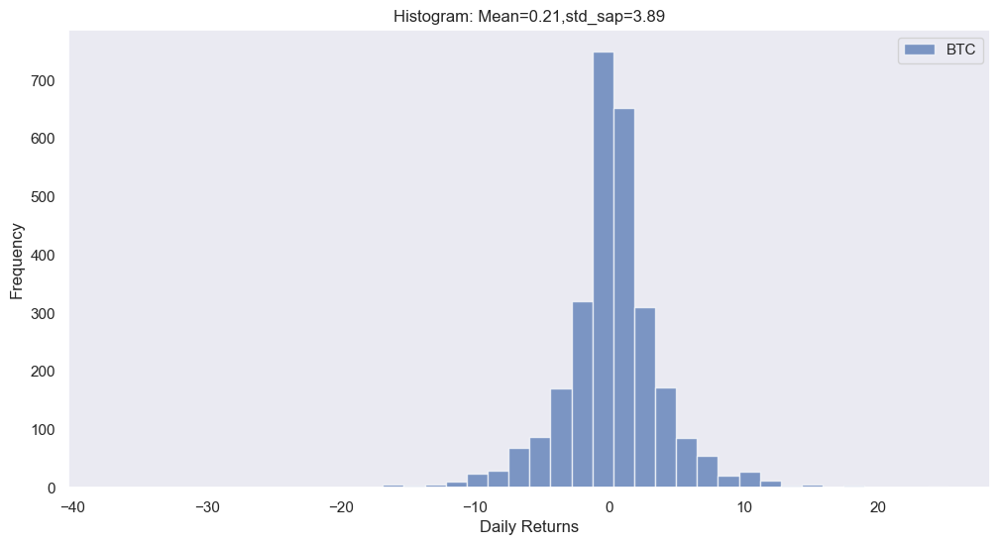

In [126]:
plt.figure(figsize=(10, 5))

daily_return_df['BTC'].plot.hist(bins = num_bins, color = 'b', alpha = 0.7, figsize = (12, 6))
#daily_return_df['ETH'].plot.hist(bins = num_bins, color = 'b', alpha = 0.7, figsize = (12, 6))
#plt.hist(daily_return_df['BTC'], bins=60, density=True, alpha=0.5, color='red', label='BTC')
#plt.hist(daily_return_df['ETH'], bins=60, density=True, alpha=0.5, color='blue', label='ETH')

plt.xlabel("Daily Returns")
plt.ylabel("Frequency")
plt.title("Histogram: Mean=" + str(mean) + ",std_sap=" + str(std_sap))
plt.legend()

plt.show()

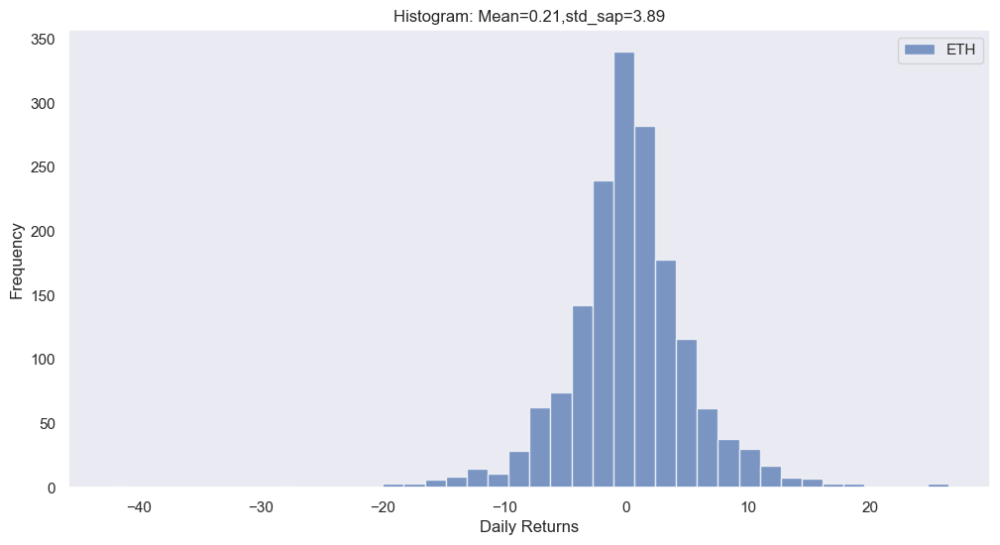

In [127]:
plt.figure(figsize=(10, 5))

daily_return_df['ETH'].plot.hist(bins = num_bins, color = 'b', alpha = 0.7, figsize = (12, 6))

plt.xlabel("Daily Returns")
plt.ylabel("Frequency")
plt.title("Histogram: Mean=" + str(mean) + ",std_sap=" + str(std_sap))
plt.legend()

plt.show()

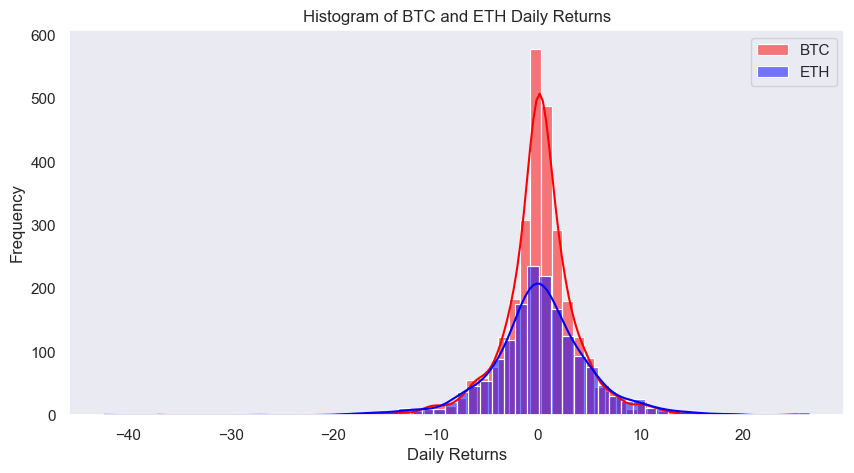

In [121]:
plt.figure(figsize=(10, 5))

sns.set(style="dark")

sns.histplot(data=daily_return_df, x="BTC", bins=60, kde=True, label="BTC", color="red")
sns.histplot(data=daily_return_df, x="ETH", bins=60, kde=True, label="ETH", color="blue")

plt.xlabel("Daily Returns")
plt.ylabel("Frequency")
plt.title("Histogram of BTC and ETH Daily Returns")
plt.legend()

plt.show()

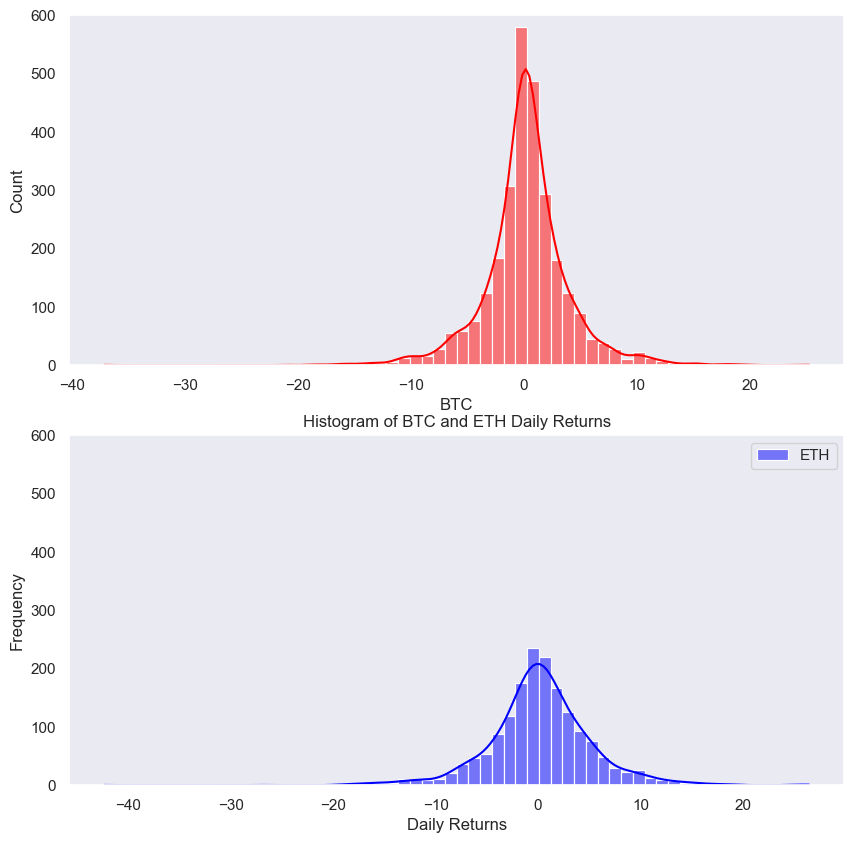

In [62]:
fig, ax = plt.subplots(2,1, figsize=(10,10))

sns.set(style="dark")

sns.histplot(data=daily_return_df, x="BTC", bins=60, kde=True, label="BTC", color="red", ax =ax[0])
sns.histplot(data=daily_return_df, x="ETH", bins=60, kde=True, label="ETH", color="blue", ax =ax[1])

plt.xlabel("Daily Returns")
plt.ylabel("Frequency")
plt.title("Histogram of BTC and ETH Daily Returns")
plt.legend()

# Set the maximum y-axis value to 600
ax[0].set_ylim(0, 600)
ax[1].set_ylim(0, 600)

plt.show();

## CODING TASK #5. PLOT SCATTERPLOT & COUNTPLOT USING SEABORN
- **Seaborn is a visualization library that sits on top of matplotlib**
- **Seaborn offers enhanced features compared to matplotlib**
- **https://seaborn.pydata.org/examples/index.html*/*
- **Check out the head of the dataframe**
- **Check out the tail of the dataframe**
- **Plot scatter plot between mean area and mean smoothness**
- **Let's print out countplot to know how many samples belong to class #0 and #1**

In [63]:
# Import Cancer data 
cancer_df = pd.read_csv('cancer.csv')

In [64]:
cancer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

In [65]:
cancer_df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [67]:
cancer_df.tail()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,0
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,0
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,0
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,0
568,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,0.1587,0.05884,...,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039,1


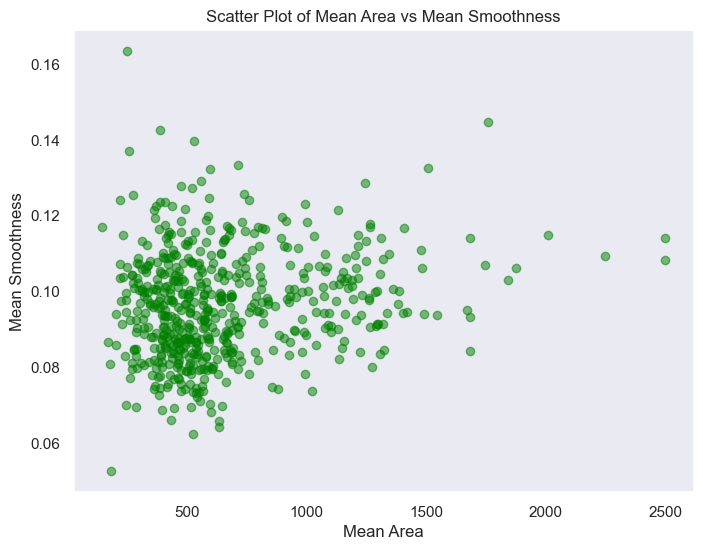

In [151]:
plt.figure(figsize=(8, 6))

plt.scatter(cancer_df['mean area'], cancer_df['mean smoothness'], color='green', alpha=0.5)

plt.xlabel('Mean Area')
plt.ylabel('Mean Smoothness')
plt.title('Scatter Plot of Mean Area vs Mean Smoothness')

plt.show()

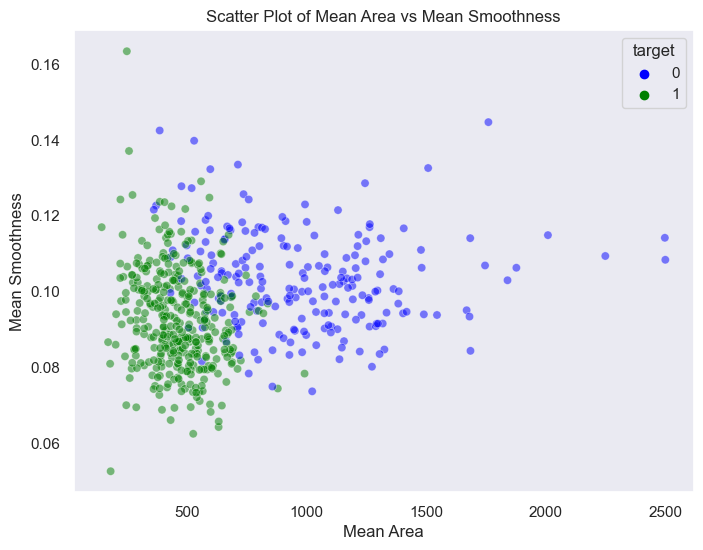

In [153]:
plt.figure(figsize=(8, 6))

sns.scatterplot(data=cancer_df, x='mean area', y='mean smoothness', hue='target', palette=['blue', 'green'], alpha=0.5)

plt.xlabel('Mean Area')
plt.ylabel('Mean Smoothness')
plt.title('Scatter Plot of Mean Area vs Mean Smoothness')

plt.show()

Ten real-valued features are computed for each cell nucleus:
a) radius (mean of distances from center to points on the perimeter)
b) texture (standard deviation of gray-scale values)
c) perimeter
d) area
e) smoothness (local variation in radius lengths)
f) compactness (perimeter^2 / area - 1.0)
g) concavity (severity of concave portions of the contour)
h) concave points (number of concave portions of the contour)
i) symmetry
j) fractal dimension ("coastline approximation" - 1)
These 10 features(a...j) are increased to 30 with feature engineering:
The mean, standard error and "worst" or largest (mean of the three largest values) of these features were computed for each image, resulting in 30 features. For instance, field 3 is Mean Radius, field 13 is Radius SE, field 23 is Worst Radius.

**PRACTICE OPPORTUNITY #5:**
- **Plot the scatterplot between the mean radius and mean area. Comment on the plot** 


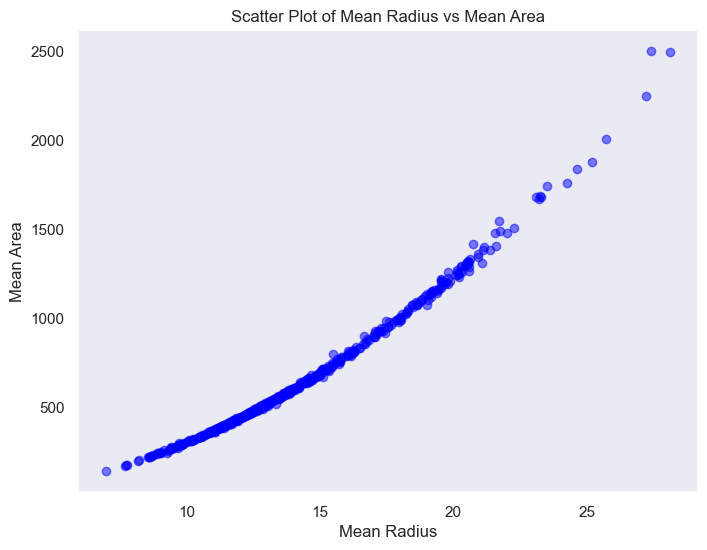

In [73]:
plt.figure(figsize=(8, 6))

plt.scatter(cancer_df['mean radius'], cancer_df['mean area'], color='blue', alpha=0.5)

plt.xlabel('Mean Radius')
plt.ylabel('Mean Area')
plt.title('Scatter Plot of Mean Radius vs Mean Area')

plt.show()

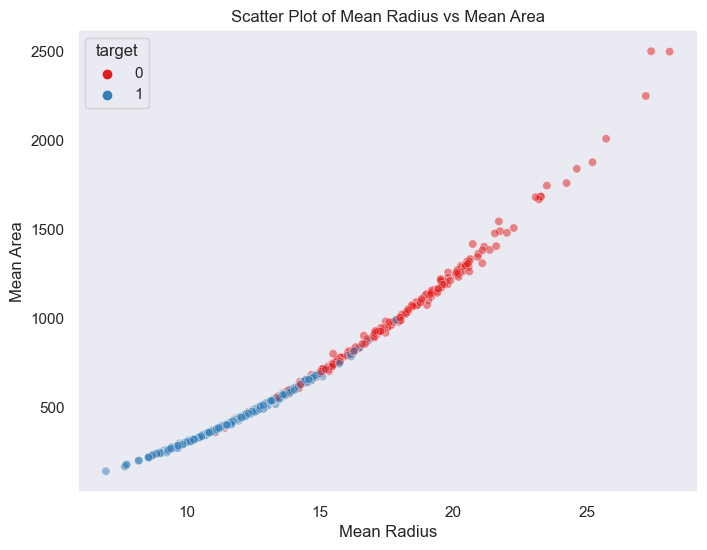

In [154]:
plt.figure(figsize=(8, 6))

sns.scatterplot(data=cancer_df, x='mean radius', y='mean area', hue='target', palette='Set1', alpha=0.5)

plt.xlabel('Mean Radius')
plt.ylabel('Mean Area')
plt.title('Scatter Plot of Mean Radius vs Mean Area')

plt.show()

In [74]:
# Comment:!!

## CODING TASK #6. PLOT PAIRPLOT, DISPLOT, AND HEATMAPS/CORRELATIONS USING SEABORN

- **Plot the pairplot**
- **Strong correlation between the mean radius and mean perimeter, mean area and mean primeter**
- **plot the distplot** 
- **Displot combines matplotlib histogram function with kdeplot() (Kernel density estimate)**
- **KDE is used to plot the Probability Density of a continuous variable.** 

In [155]:
sns.pairplot(cancer_df, palette="Viridis")

plt.show()

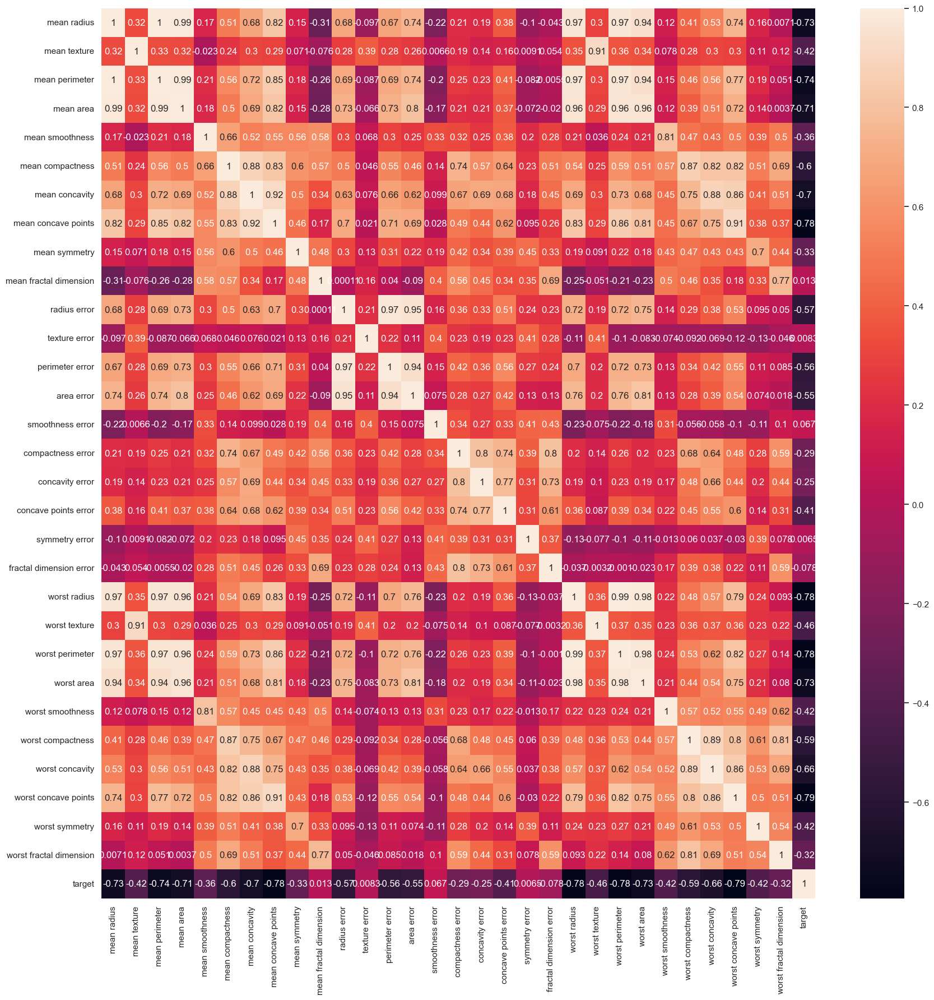

In [118]:
plt.figure(figsize=(18, 18))
sns.heatmap(cancer_df.corr(), annot=True)
plt.tight_layout()
plt.show();

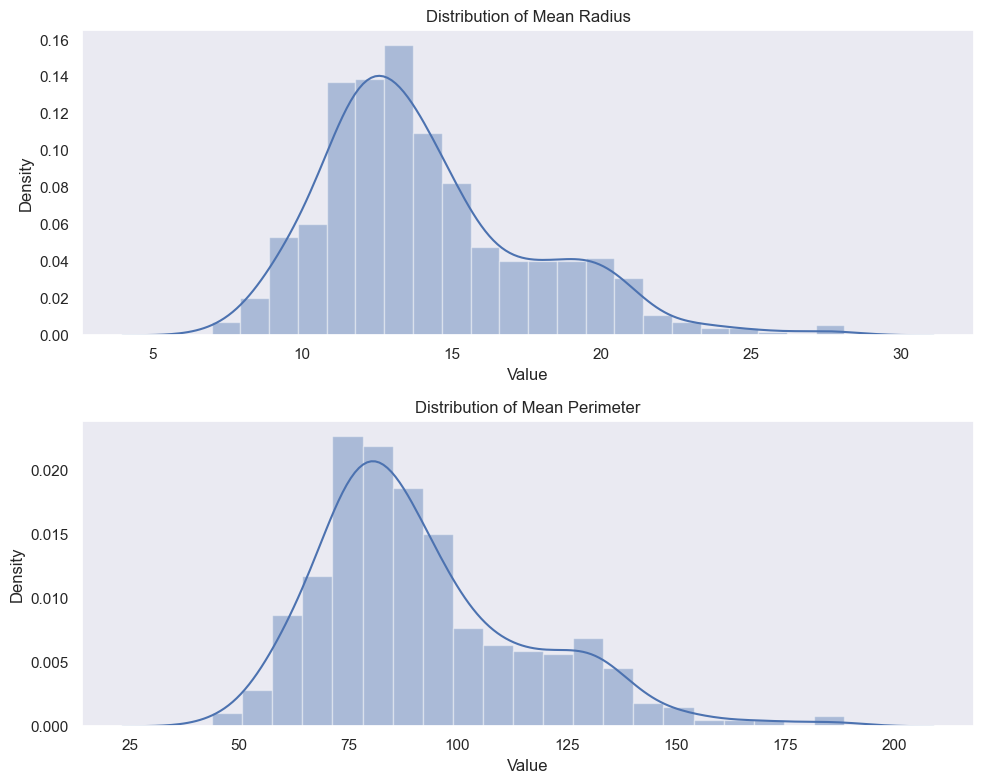

In [156]:
# Create subplots for the two distplots
fig, axes = plt.subplots(2, 1, figsize=(10, 8))

# Plot distplot for 'mean radius'
sns.distplot(cancer_df['mean radius'], ax=axes[0])
axes[0].set_title('Distribution of Mean Radius')

# Plot distplot for 'mean perimeter'
sns.distplot(cancer_df['mean perimeter'], ax=axes[1])
axes[1].set_title('Distribution of Mean Perimeter')

# Set common x-axis label
for ax in axes:
    ax.set_xlabel('Value')

# Display the plots
plt.tight_layout()
plt.show()

**PRACTICE OPPORTUNITY #6:**
- **Plot two separate distplot for each target class #0 and target class #1**


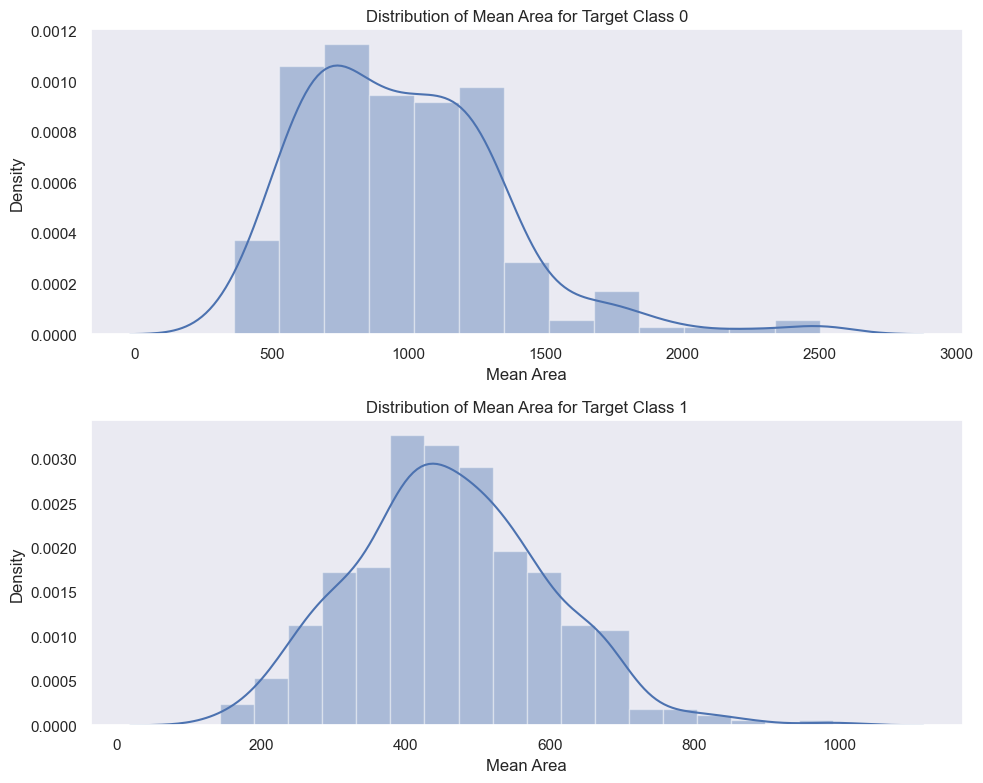

In [157]:
# Filter the DataFrame based on target class 0 and target class 1
class_0_data = cancer_df[cancer_df['target'] == 0]
class_1_data = cancer_df[cancer_df['target'] == 1]

# Create subplots for the two distplots
fig, axes = plt.subplots(2, 1, figsize=(10, 8))

# Plot distplot for target class 0
sns.distplot(class_0_data['mean area'], ax=axes[0])
axes[0].set_title('Distribution of Mean Area for Target Class 0')

# Plot distplot for target class 1
sns.distplot(class_1_data['mean area'], ax=axes[1])
axes[1].set_title('Distribution of Mean Area for Target Class 1')

# Set common x-axis label
for ax in axes:
    ax.set_xlabel('Mean Area')

# Display the plots
plt.tight_layout()
plt.show()

# EXCELLENT JOB!

# FINAL CAPSTONE PROJECT 

- In this project, we will visualize stock prices using Seaborn and Matplotlib. 4 Stocks are considered including JP Morgan Chase (JP), Procter and Gamble (P&G) (PG), Apple (AAPL) and United Airlines (UAL).
- Using the stock_daily_prices.csv and stocks_daily_returns.csv dataset included in the course/workshop package, please do the following:
    - Import both datasets using Pandas.
    - Using Matplotlib, plot lineplots that display all 4 stocks daily prices on one single figure.
    - Using Matplotlib, plot 4 stocks daily prices on multiple subplots.
    - Using Matplotlib, plot the 4 plots on subplots next to each other (all figures in one row).
    - Using Matplotlib, plot the scatterplot between Apple and JP Morgan daily returns. 
    - Using Seaborn, plot similar scatterplot between Apple and JP Morgan daily returns. 
    - Assume that you decided to become bullish on AAPL and you allocated 70% of your assets in it. You also decided to equally divide the rest of your assets in other stocks (JPM, PG, and UAL). Using Matplotlib, plot a pie chart that shows these allocations. Use 'explode’ attribute to increase the separation between AAPL and the rest of the portfolio.
    - Using Matplotlib, plot the histogram for United Airlines and P&G returns using 40 bins with red color. Display the mean and Standard deviation for both stocks on top of the figure. What did you conclude from this graph?
    - Using Seaborn, plot a heatmap that shows the correlations between stocks daily returns. Comment on the correlation between UAL and P&G.
    - Plot a 3D plot showing all daily returns from JPM, AAPL and UAL [External Research is required].

In [84]:
df_stock_prices = pd.read_csv("stock_daily_prices.csv")
df_stock_prices

FileNotFoundError: [Errno 2] No such file or directory: 'stock_daily_prices.csv'

# GREAT JOB!

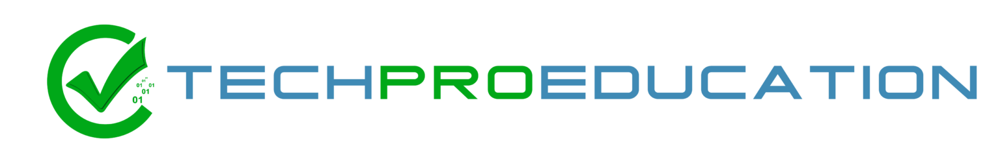